In [4]:
# ---------------------------------------------------------
# 🔍 EXPLORE PCB_DATASET FOLDER STRUCTURE (JUPYTER VERSION)
# ---------------------------------------------------------

import os

print("🔍 EXPLORING PCB_DATASET FOLDER CONTENTS")
print("=" * 60)

# WINDOWS PATH (ESCAPED)
pcb_dataset_path = r"C:\Users\Kandu\info_temp\PCB_DATASET"

# Check if folder exists
if not os.path.exists(pcb_dataset_path):
    print(f"❌ PCB_DATASET folder not found at: {pcb_dataset_path}")
    print("Please check the path or create the folder")
else:
    print(f"✅ PCB_DATASET folder found: {pcb_dataset_path}")

    # Explore complete structure
    def explore_pcb_dataset(base_path):
        print(f"\n📂 COMPLETE FOLDER STRUCTURE:")
        print("-" * 50)

        total_files = 0
        total_folders = 0
        image_files = []
        other_files = []

        for root, dirs, files in os.walk(base_path):
            level = root.replace(base_path, '').count(os.sep)
            indent = '  ' * level
            folder_name = os.path.basename(root)

            print(f"{indent}📁 {folder_name}/")

            subindent = '  ' * (level + 1)
            for file in files:
                file_path = os.path.join(root, file)
                total_files += 1

                # Categorize files
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                    image_files.append(file_path)
                    print(f"{subindent}🖼️  {file}")
                elif file.lower().endswith(('.zip', '.rar')):
                    print(f"{subindent}📦 {file}")
                elif file.lower().endswith(('.txt', '.csv', '.json')):
                    print(f"{subindent}📄 {file}")
                else:
                    other_files.append(file_path)
                    print(f"{subindent}📄 {file}")

            total_folders += len(dirs)

        # Summary
        print("\n📊 SUMMARY:")
        print(f"📁 Total folders: {total_folders}")
        print(f"📄 Total files: {total_files}")
        print(f"🖼️  Image files: {len(image_files)}")
        print(f"📄 Other files: {len(other_files)}")

        if image_files:
            print(f"\n📸 Sample image files (first 10):")
            for img in image_files[:10]:
                print(f"  - {os.path.relpath(img, base_path)}")

        return {
            'total_folders': total_folders,
            'total_files': total_files,
            'image_files': image_files,
            'other_files': other_files
        }

    dataset_info = explore_pcb_dataset(pcb_dataset_path)

    # Show folder size
    print(f"\n💾 Folder size info:")
    total_size = 0
    for dirpath, dirnames, filenames in os.walk(pcb_dataset_path):
        for f in filenames:
            fp = os.path.join(dirpath, f)
            total_size += os.path.getsize(fp)

    print(f"📦 Total size: {total_size / (1024**3):.2f} GB")

🔍 EXPLORING PCB_DATASET FOLDER CONTENTS
✅ PCB_DATASET folder found: C:\Users\Kandu\info_temp\PCB_DATASET

📂 COMPLETE FOLDER STRUCTURE:
--------------------------------------------------
📁 PCB_DATASET/
  📄 Untitled.ipynb
  📁 .ipynb_checkpoints/
    📄 Untitled-checkpoint.ipynb
  📁 images/
    📁 .ipynb_checkpoints/
    📁 Missing_hole/
      🖼️  01_missing_hole_01.jpg
      🖼️  01_missing_hole_02.jpg
      🖼️  01_missing_hole_03.jpg
      🖼️  01_missing_hole_04.jpg
      🖼️  01_missing_hole_05.jpg
      🖼️  01_missing_hole_06.jpg
      🖼️  01_missing_hole_07.jpg
      🖼️  01_missing_hole_08.jpg
      🖼️  01_missing_hole_09.jpg
      🖼️  01_missing_hole_10.jpg
      🖼️  01_missing_hole_11.jpg
      🖼️  01_missing_hole_12.jpg
      🖼️  01_missing_hole_13.jpg
      🖼️  01_missing_hole_14.jpg
      🖼️  01_missing_hole_15.jpg
      🖼️  01_missing_hole_16.jpg
      🖼️  01_missing_hole_17.jpg
      🖼️  01_missing_hole_18.jpg
      🖼️  01_missing_hole_19.jpg
      🖼️  01_missing_hole_20.jpg
      

In [5]:
# ---------------------------------------------------------
# 🎯 MODULE 1 (JUPYTER VERSION)
# ---------------------------------------------------------

print("🎯 MODULE 1: DATASET SETUP AND IMAGE SUBTRACTION")
print("=" * 60)

# Install required packages only if missing (JUPYTER SAFE)
# !pip install opencv-python matplotlib numpy pandas tqdm scikit-image

import cv2
import numpy as np
import matplotlib.pyplot as plt
import json
import pandas as pd
from pathlib import Path
from tqdm import tqdm
from skimage import exposure
import time

# Local Windows Path
PCB_DATASET_PATH = r"C:\Users\Kandu\info_temp\PCB_DATASET"

# Create organized structure - ENSURING ALL DIRECTORIES EXIST
def create_project_structure():
    """Create essential project structure with proper directory creation"""
    module_dirs = [
        "modules/module1_image_processing/processed_images",
        "modules/module1_image_processing/defect_masks",
        "modules/module1_image_processing/difference_maps",
        "modules/module1_image_processing/visualizations",
        "modules/module1_image_processing/reports",  # This one is crucial!
        "modules/module2_contour_detection",
    ]

    for dir_path in module_dirs:
        full_path = os.path.join(PCB_DATASET_PATH, dir_path)
        os.makedirs(full_path, exist_ok=True)
        print(f"✅ Created: {dir_path}/")

# CREATE STRUCTURE BEFORE DEFINING PROGRESS FILE
create_project_structure()

# Now define progress file after ensuring directory exists
PROGRESS_FILE = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/reports", "progress_tracker.json")

def load_progress():
    """Load progress from previous run"""
    try:
        if os.path.exists(PROGRESS_FILE):
            with open(PROGRESS_FILE, 'r') as f:
                return json.load(f)
    except Exception as e:
        print(f"⚠️ Error loading progress file: {e}")

    # Return default progress structure
    return {
        'processed_images': [],
        'failed_images': [],
        'remaining_images': [],
        'start_time': None,
        'total_images': 0
    }

def save_progress(progress_data):
    """Save current progress - with error handling"""
    try:
        # Ensure directory exists
        os.makedirs(os.path.dirname(PROGRESS_FILE), exist_ok=True)
        with open(PROGRESS_FILE, 'w') as f:
            json.dump(progress_data, f, indent=2)
    except Exception as e:
        print(f"❌ Error saving progress: {e}")

def get_all_images_to_process():
    """Get list of all images that need processing"""
    images_path = os.path.join(PCB_DATASET_PATH, "images")
    defect_classes = [d for d in os.listdir(images_path) if os.path.isdir(os.path.join(images_path, d))]

    all_images = []
    for defect_class in defect_classes:
        class_path = os.path.join(images_path, defect_class)
        image_files = [f for f in os.listdir(class_path) if f.endswith('.jpg')]

        for image_file in image_files:
            # Extract PCB ID from filename (first 2 digits)
            try:
                pcb_id = int(image_file.split('_')[0])
                all_images.append({
                    'defect_class': defect_class,
                    'filename': image_file,
                    'pcb_id': pcb_id,
                    'image_key': f"{defect_class}_{image_file}"  # Unique identifier
                })
            except ValueError:
                print(f"⚠️ Skipping {image_file} - cannot extract PCB ID")
                continue

    return all_images

def get_remaining_images(progress):
    """Get images that haven't been processed yet"""
    processed_keys = set([img['image_key'] for img in progress['processed_images']])
    failed_keys = set([img['image_key'] for img in progress['failed_images']])

    all_images = get_all_images_to_process()
    remaining_images = []

    for img in all_images:
        if img['image_key'] not in processed_keys and img['image_key'] not in failed_keys:
            remaining_images.append(img)

    return remaining_images

# Analyze dataset structure
def analyze_dataset():
    """Analyze the PCB dataset structure"""
    print("\n🔍 DATASET ANALYSIS")
    print("-" * 40)

    images_path = os.path.join(PCB_DATASET_PATH, "images")
    pcb_used_path = os.path.join(PCB_DATASET_PATH, "PCB_USED")

    # Defect classes
    defect_classes = [d for d in os.listdir(images_path) if os.path.isdir(os.path.join(images_path, d))]

    print(f"🎯 Defect Classes: {len(defect_classes)}")
    total_images = 0
    for class_name in defect_classes:
        class_path = os.path.join(images_path, class_name)
        image_count = len([f for f in os.listdir(class_path) if f.endswith('.jpg')])
        total_images += image_count
        print(f"   {class_name}: {image_count} images")

    # Reference PCBs
    ref_count = len([f for f in os.listdir(pcb_used_path) if f.endswith('.JPG')])
    print(f"📋 Reference PCBs: {ref_count} images")
    print(f"📊 Total defect images: {total_images}")

    return defect_classes, total_images

defect_classes, total_images = analyze_dataset()

# Image alignment function
def align_images(reference, test_image):
    """
    Align test image with reference using feature matching
    """
    # Convert to grayscale
    ref_gray = cv2.cvtColor(reference, cv2.COLOR_BGR2GRAY)
    test_gray = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)

    # Initialize ORB detector
    orb = cv2.ORB_create(500)

    # Find keypoints and descriptors
    kp1, des1 = orb.detectAndCompute(ref_gray, None)
    kp2, des2 = orb.detectAndCompute(test_gray, None)

    if des1 is not None and des2 is not None and len(des1) > 10 and len(des2) > 10:
        # Feature matching
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, des2)
        matches = sorted(matches, key=lambda x: x.distance)

        if len(matches) > 10:
            # Extract matched points
            src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

            # Find homography matrix
            M, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)

            if M is not None:
                # Apply perspective transformation
                h, w = ref_gray.shape
                test_aligned = cv2.warpPerspective(test_image, M, (w, h))
                return test_aligned, len(matches)

    # Fallback: resize to match dimensions
    test_aligned = cv2.resize(test_image, (ref_gray.shape[1], ref_gray.shape[0]))
    return test_aligned, 0

# Image preprocessing function
def preprocess_images(reference, test_image):
    """
    Preprocess images for better defect detection
    """
    # Convert to grayscale
    ref_gray = cv2.cvtColor(reference, cv2.COLOR_BGR2GRAY)
    test_gray = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)

    # Apply histogram equalization for better contrast
    ref_eq = exposure.equalize_hist(ref_gray)
    test_eq = exposure.equalize_hist(test_gray)

    # Convert back to 8-bit
    ref_eq = (ref_eq * 255).astype(np.uint8)
    test_eq = (test_eq * 255).astype(np.uint8)

    # Apply Gaussian blur to reduce noise
    ref_processed = cv2.GaussianBlur(ref_eq, (3, 3), 0)
    test_processed = cv2.GaussianBlur(test_eq, (3, 3), 0)

    return ref_processed, test_processed

# Defect detection using subtraction and thresholding
def detect_defects(reference, test_image):
    """
    Detect defects using image subtraction and Otsu's thresholding
    """
    # Preprocess images
    ref_processed, test_processed = preprocess_images(reference, test_image)

    # Absolute difference
    diff = cv2.absdiff(ref_processed, test_processed)

    # Apply Otsu's thresholding
    _, thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Morphological operations to clean the mask
    kernel = np.ones((3, 3), np.uint8)

    # Remove small noise
    thresh_cleaned = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)

    # Close small holes in defects
    thresh_cleaned = cv2.morphologyEx(thresh_cleaned, cv2.MORPH_CLOSE, kernel)

    return diff, thresh_cleaned

# Quality check for processed images
def check_image_quality(reference, aligned_image, defect_mask):
    """
    Perform basic quality checks
    """
    # Check if images are properly aligned (similar dimensions)
    dim_match = reference.shape == aligned_image.shape

    # Check if defect mask has reasonable content
    defect_pixels = np.count_nonzero(defect_mask)
    total_pixels = defect_mask.size
    defect_ratio = defect_pixels / total_pixels

    # Reasonable defect ratio (not too small, not too large)
    reasonable_defects = 0.0001 < defect_ratio < 0.5

    return {
        'dimensions_match': dim_match,
        'defect_pixels': defect_pixels,
        'defect_ratio': defect_ratio,
        'reasonable_defects': reasonable_defects
    }

# Process single image pair
def process_single_image_pair(defect_class, image_file, pcb_id):
    """
    Process a single reference-defect image pair
    """
    try:
        # Load images
        reference_path = os.path.join(PCB_DATASET_PATH, "PCB_USED", f"{pcb_id:02d}.JPG")
        defect_path = os.path.join(PCB_DATASET_PATH, "images", defect_class, image_file)

        reference = cv2.imread(reference_path)
        defect = cv2.imread(defect_path)

        if reference is None or defect is None:
            return None, "Failed to load images"

        # Step 1: Align images
        aligned_defect, feature_matches = align_images(reference, defect)

        # Step 2: Detect defects
        diff_map, defect_mask = detect_defects(reference, aligned_defect)

        # Step 3: Quality check
        quality_check = check_image_quality(reference, aligned_defect, defect_mask)

        # Save outputs
        base_name = f"{defect_class}_{image_file.split('.')[0]}"

        # Save aligned image
        aligned_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/processed_images",
                                  f"aligned_{base_name}.jpg")
        cv2.imwrite(aligned_path, aligned_defect)

        # Save defect mask
        mask_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/defect_masks",
                               f"mask_{base_name}.png")
        cv2.imwrite(mask_path, defect_mask)

        # Save difference map
        diff_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/difference_maps",
                               f"diff_{base_name}.png")
        cv2.imwrite(diff_path, diff_map)

        # Create and save visualization
        create_visualization(reference, aligned_defect, diff_map, defect_mask, defect_class, image_file, base_name)

        # Return processing results
        processing_result = {
            'defect_class': defect_class,
            'filename': image_file,
            'pcb_id': pcb_id,
            'feature_matches': feature_matches,
            'defect_pixels': int(quality_check['defect_pixels']),
            'defect_ratio': float(quality_check['defect_ratio']),
            'dimensions_match': quality_check['dimensions_match'],
            'reasonable_defects': quality_check['reasonable_defects'],
            'aligned_image_path': aligned_path,
            'mask_path': mask_path,
            'diff_path': diff_path,
            'status': 'success',
            'image_key': f"{defect_class}_{image_file}",
            'processing_time': time.strftime("%Y-%m-%d %H:%M:%S")
        }

        return processing_result, None

    except Exception as e:
        return None, str(e)

# Create visualization
def create_visualization(reference, aligned_defect, diff_map, defect_mask, defect_class, filename, base_name):
    """
    Create and save visualization of processing results
    """
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))

    # Reference PCB
    axes[0, 0].imshow(cv2.cvtColor(reference, cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title('Reference PCB')
    axes[0, 0].axis('off')

    # Aligned defect image
    axes[0, 1].imshow(cv2.cvtColor(aligned_defect, cv2.COLOR_BGR2RGB))
    axes[0, 1].set_title('Aligned Test Image')
    axes[0, 1].axis('off')

    # Difference map
    axes[1, 0].imshow(diff_map, cmap='hot')
    axes[1, 0].set_title('Difference Map')
    axes[1, 0].axis('off')

    # Defect mask with contours
    defect_highlighted = aligned_defect.copy()
    contours, _ = cv2.findContours(defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(defect_highlighted, contours, -1, (0, 0, 255), 2)

    axes[1, 1].imshow(cv2.cvtColor(defect_highlighted, cv2.COLOR_BGR2RGB))
    axes[1, 1].set_title('Defects Highlighted (Red)')
    axes[1, 1].axis('off')

    plt.suptitle(f'Defect Detection: {defect_class} - {filename}', fontsize=14)
    plt.tight_layout()

    # Save visualization
    viz_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/visualizations",
                          f"viz_{base_name}.png")
    plt.savefig(viz_path, dpi=150, bbox_inches='tight')
    plt.close()

# Main processing function with resume capability
def process_all_images_with_resume():
    """
    Process ALL images with resume capability
    """
    # Load progress
    progress = load_progress()

    # Get remaining images
    remaining_images = get_remaining_images(progress)

    if not remaining_images:
        print("✅ All images have already been processed!")
        return progress['processed_images'], progress['failed_images']

    print(f"\n🚀 PROCESSING {len(remaining_images)} REMAINING IMAGES")
    print("=" * 50)

    # Update progress with start time if this is a new run
    if not progress['start_time']:
        progress['start_time'] = time.strftime("%Y-%m-%d %H:%M:%S")
        progress['total_images'] = len(get_all_images_to_process())
        # Save initial progress
        save_progress(progress)

    # Progress bar
    pbar = tqdm(total=len(remaining_images), desc="Processing")

    processed_count = 0
    failed_count = 0

    for image_info in remaining_images:
        try:
            # Process image pair
            result, error = process_single_image_pair(
                image_info['defect_class'],
                image_info['filename'],
                image_info['pcb_id']
            )

            if result:
                progress['processed_images'].append(result)
                processed_count += 1
            else:
                failed_info = {
                    'defect_class': image_info['defect_class'],
                    'filename': image_info['filename'],
                    'error': error,
                    'image_key': image_info['image_key']
                }
                progress['failed_images'].append(failed_info)
                failed_count += 1

            # Update progress bar
            pbar.set_postfix({
                'Class': image_info['defect_class'],
                'Success': len(progress['processed_images']),
                'Failed': len(progress['failed_images'])
            })

            # Save progress after each image
            save_progress(progress)

        except Exception as e:
            failed_info = {
                'defect_class': image_info['defect_class'],
                'filename': image_info['filename'],
                'error': str(e),
                'image_key': image_info['image_key']
            }
            progress['failed_images'].append(failed_info)
            failed_count += 1
            save_progress(progress)

        pbar.update(1)

    pbar.close()
    return progress['processed_images'], progress['failed_images']

# Generate comprehensive report
def generate_reports(all_results, failed_images):
    """
    Generate processing reports and summaries
    """
    print("\n📊 GENERATING REPORTS")
    print("-" * 40)

    # Convert to DataFrame
    df = pd.DataFrame(all_results)

    # Summary statistics
    total_processed = len(all_results)
    total_failed = len(failed_images)
    total_images = total_processed + total_failed
    success_rate = (total_processed / total_images) * 100 if total_images > 0 else 0

    print(f"✅ Successfully processed: {total_processed} images")
    print(f"❌ Failed to process: {total_failed} images")
    print(f"📈 Success rate: {success_rate:.2f}%")

    # Class-wise summary
    if not df.empty:
        class_summary = df.groupby('defect_class').agg({
            'filename': 'count',
            'defect_pixels': 'mean',
            'defect_ratio': 'mean',
            'reasonable_defects': 'sum'
        }).round(3)

        print(f"\n🎯 Class-wise Summary:")
        print(class_summary)

    # Save detailed results
    results_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/reports", "processing_results.csv")
    df.to_csv(results_path, index=False)
    print(f"💾 Detailed results saved: {results_path}")

    # Save failed images list
    if failed_images:
        failed_df = pd.DataFrame(failed_images)
        failed_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/reports", "failed_images.csv")
        failed_df.to_csv(failed_path, index=False)
        print(f"💾 Failed images list saved: {failed_path}")

    # Save summary
    summary = {
        'total_images': total_images,
        'successfully_processed': total_processed,
        'failed_images': total_failed,
        'success_rate': round(success_rate, 2),
        'defect_classes_processed': list(df['defect_class'].unique()) if not df.empty else [],
        'average_defect_pixels': float(df['defect_pixels'].mean()) if not df.empty else 0,
        'processing_date': time.strftime("%Y-%m-%d %H:%M:%S")
    }

    summary_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/reports", "processing_summary.json")
    with open(summary_path, 'w') as f:
        json.dump(summary, f, indent=2)

    print(f"💾 Summary saved: {summary_path}")

    return summary

# Display sample results
def display_sample_results(all_results, num_samples=3):
    """
    Display sample processing results
    """
    if not all_results:
        print("No results to display")
        return

    print(f"\n🖼️  DISPLAYING {min(num_samples, len(all_results))} SAMPLE RESULTS")
    print("-" * 40)

    samples = all_results[:num_samples]

    for i, sample in enumerate(samples):
        print(f"\nSample {i+1}: {sample['defect_class']} - {sample['filename']}")
        print(f"  PCB ID: {sample['pcb_id']}")
        print(f"  Feature matches: {sample['feature_matches']}")
        print(f"  Defect pixels: {sample['defect_pixels']}")
        print(f"  Defect ratio: {sample['defect_ratio']:.4f}")
        print(f"  Dimensions match: {sample['dimensions_match']}")
        print(f"  Reasonable defects: {sample['reasonable_defects']}")

# Check if there's existing progress
def check_existing_progress():
    """Check and display existing progress"""
    progress = load_progress()
    total_processed = len(progress['processed_images'])
    total_failed = len(progress['failed_images'])
    total_completed = total_processed + total_failed

    if total_completed > 0:
        print(f"\n📋 EXISTING PROGRESS FOUND:")
        print(f"   ✅ Processed: {total_processed} images")
        print(f"   ❌ Failed: {total_failed} images")
        print(f"   📊 Completion: {total_completed}/{progress.get('total_images', '?')} images")

        if progress.get('start_time'):
            print(f"   ⏰ Started: {progress['start_time']}")

        return True
    return False

# Execute Module 1 with resume capability
print("\n🚀 STARTING MODULE 1 EXECUTION (WITH RESUME CAPABILITY)")
print("=" * 60)

# Check for existing progress
has_existing_progress = check_existing_progress()

if has_existing_progress:
    print("\n🔄 RESUMING FROM PREVIOUS PROGRESS...")
else:
    print("\n🆕 STARTING NEW PROCESSING SESSION...")

# Process all images with resume capability
start_time = time.time()
all_results, failed_images = process_all_images_with_resume()
end_time = time.time()

# Generate reports
summary = generate_reports(all_results, failed_images)

# Display samples
display_sample_results(all_results)

# Final summary
print(f"\n🎉 MODULE 1 COMPLETED SUCCESSFULLY!")
print("=" * 50)
print(f"⏰ Total processing time: {end_time - start_time:.2f} seconds")
print(f"📁 All outputs saved in: {PCB_DATASET_PATH}/modules/module1_image_processing/")
print(f"🖼️  Processed images: {summary['successfully_processed']}/{summary['total_images']}")
print(f"📈 Success rate: {summary['success_rate']}%")

print(f"\n📂 OUTPUT DIRECTORY STRUCTURE:")
print(f"   📁 processed_images/     - Aligned and cleaned images")
print(f"   📁 defect_masks/         - Binary defect masks")
print(f"   📁 difference_maps/      - Image subtraction results")
print(f"   📁 visualizations/       - Comprehensive result visualizations")
print(f"   📁 reports/              - Processing reports and summaries")

# Clean up progress file if everything is completed
if len(failed_images) == 0 and len(all_results) == summary['total_images']:
    if os.path.exists(PROGRESS_FILE):
        os.remove(PROGRESS_FILE)
        print(f"\n🧹 Progress file cleaned up (processing completed)")

🎯 MODULE 1: DATASET SETUP AND IMAGE SUBTRACTION
✅ Created: modules/module1_image_processing/processed_images/
✅ Created: modules/module1_image_processing/defect_masks/
✅ Created: modules/module1_image_processing/difference_maps/
✅ Created: modules/module1_image_processing/visualizations/
✅ Created: modules/module1_image_processing/reports/
✅ Created: modules/module2_contour_detection/

🔍 DATASET ANALYSIS
----------------------------------------
🎯 Defect Classes: 7
   .ipynb_checkpoints: 0 images
   Missing_hole: 115 images
   Mouse_bite: 115 images
   Open_circuit: 116 images
   Short: 116 images
   Spur: 115 images
   Spurious_copper: 116 images
📋 Reference PCBs: 10 images
📊 Total defect images: 693

🚀 STARTING MODULE 1 EXECUTION (WITH RESUME CAPABILITY)

📋 EXISTING PROGRESS FOUND:
   ✅ Processed: 53 images
   ❌ Failed: 0 images
   📊 Completion: 53/693 images
   ⏰ Started: 2025-11-18 22:46:32

🔄 RESUMING FROM PREVIOUS PROGRESS...

🚀 PROCESSING 640 REMAINING IMAGES



Processing: 100%|████████████████████| 640/640 [1:27:07<00:00,  8.25s/it, Class=Spurious_copper, Success=693, Failed=0]cessing: 100%|████████████████████| 640/640 [1:27:07<00:00,  8.25s/it, Class=Spurious_copper, Success=693, Failed=0]17s/it, Class=Spurious_copper, Success=693, Failed=0]cessing: 100%|████████████████████| 640/640 [1:27:07<00:00,  8.25s/it, Class=Spurious_copper, Success=693, Failed=0]cessing: 100%|████████████████████| 640/640 [1:27:07<00:00,  8.25s/it, Class=Spurious_copper, Success=693, Failed=0]



📊 GENERATING REPORTS
----------------------------------------
✅ Successfully processed: 693 images
❌ Failed to process: 0 images
📈 Success rate: 100.00%

🎯 Class-wise Summary:
                 filename  defect_pixels  defect_ratio  reasonable_defects
defect_class                                                              
Missing_hole          115      19196.017         0.003                 115
Mouse_bite            115      22896.322         0.004                 115
Open_circuit          116      26798.078         0.005                 116
Short                 116      36287.672         0.006                 116
Spur                  115      25538.661         0.004                 115
Spurious_copper       116      23384.448         0.004                 116
💾 Detailed results saved: C:\Users\Kandu\info_temp\PCB_DATASET\modules/module1_image_processing/reports\processing_results.csv
💾 Summary saved: C:\Users\Kandu\info_temp\PCB_DATASET\modules/module1_image_processing/reports\p

🚀 GENERATING COMPREHENSIVE VISUALIZATIONS

1️⃣ GENERATING MAIN COMPARISON ACROSS ALL CLASSES
🔍 Processing Missing_hole...
❌ Error processing Missing_hole: invalid literal for int() with base 10: 'hole'
🔍 Processing Mouse_bite...
❌ Error processing Mouse_bite: invalid literal for int() with base 10: 'bite'
🔍 Processing Open_circuit...
❌ Error processing Open_circuit: invalid literal for int() with base 10: 'circuit'
🔍 Processing Short...
✅ Short: 24712 defect pixels (0.514%) processing Missing_hole: invalid literal for int() with base 10: 'hole'
🔍 Processing Mouse_bite...
❌ Error processing Mouse_bite: invalid literal for int() with base 10: 'bite'
🔍 Processing Open_circuit...
❌ Error processing Open_circuit: invalid literal for int() with base 10: 'circuit'
🔍 Processing Short...

🔍 Processing Spur...
pur: 24365 defect pixels (0.506%)) processing Missing_hole: invalid literal for int() with base 10: 'hole'
🔍 Processing Mouse_bite...
❌ Error processing Mouse_bite: invalid literal for int

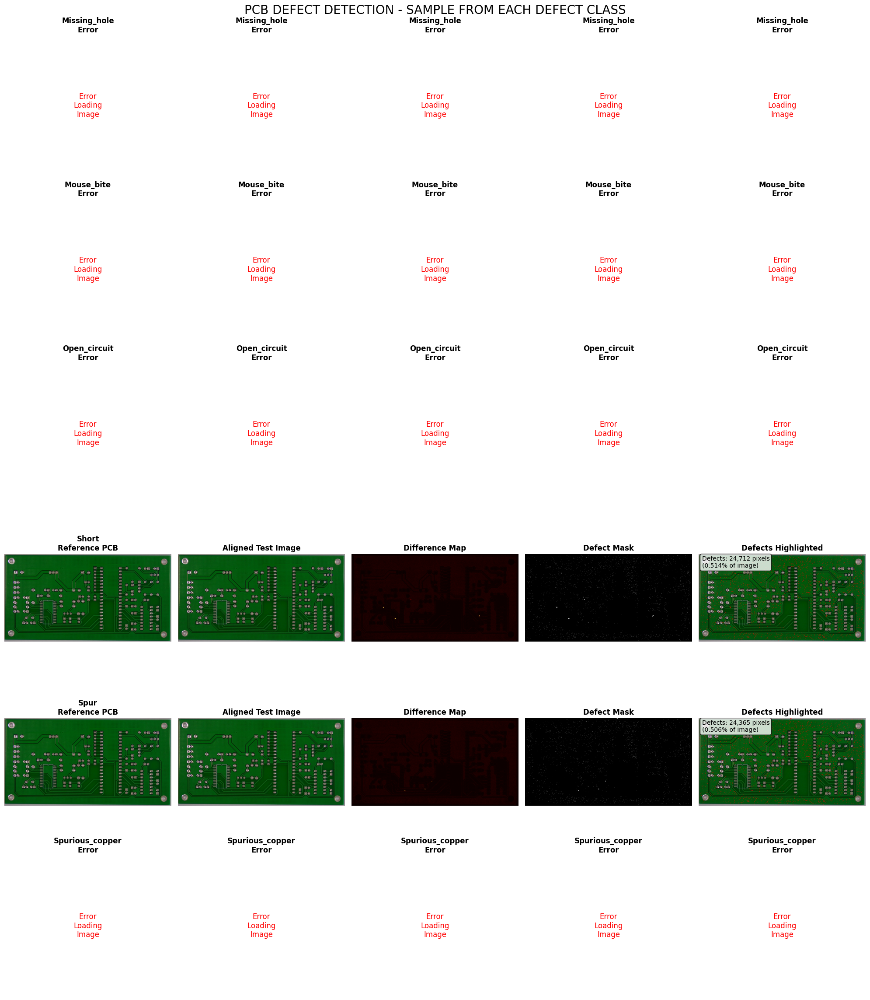


💾 Comprehensive visualization saved: C:\Users\Kandu\info_temp\PCB_DATASET\modules/module1_image_processing\all_defect_classes_comparison.png

2️⃣ GENERATING DETAILED INDIVIDUAL CLASS ANALYSIS

🎯 DETAILED ANALYSIS: Missing_hole
--------------------------------------------------


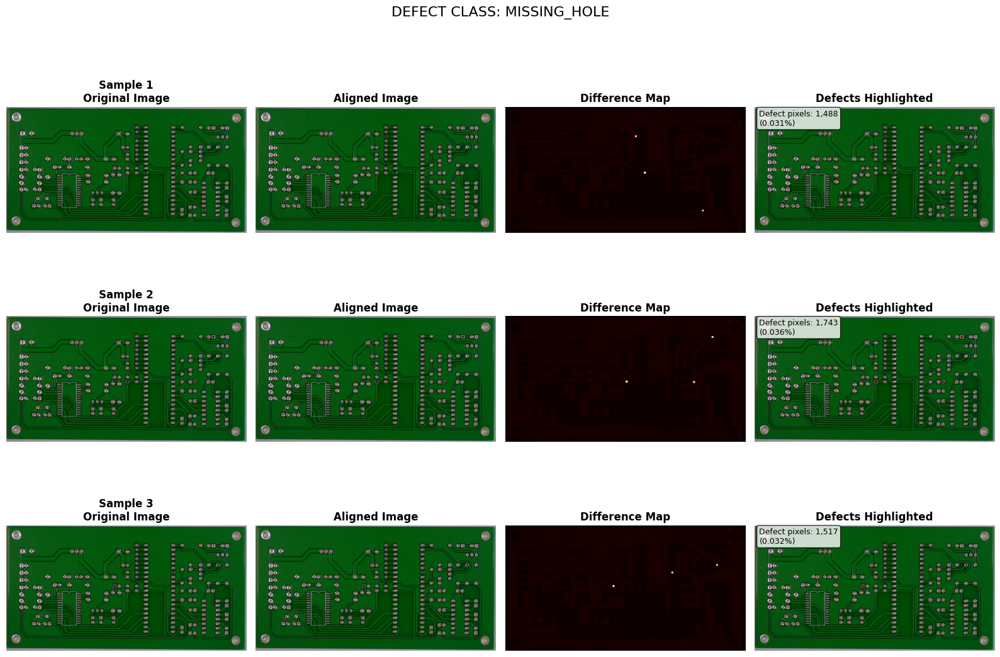

💾 Missing_hole visualization saved: C:\Users\Kandu\info_temp\PCB_DATASET\modules/module1_image_processing\Missing_hole_samples.png

🎯 DETAILED ANALYSIS: Mouse_bite
--------------------------------------------------


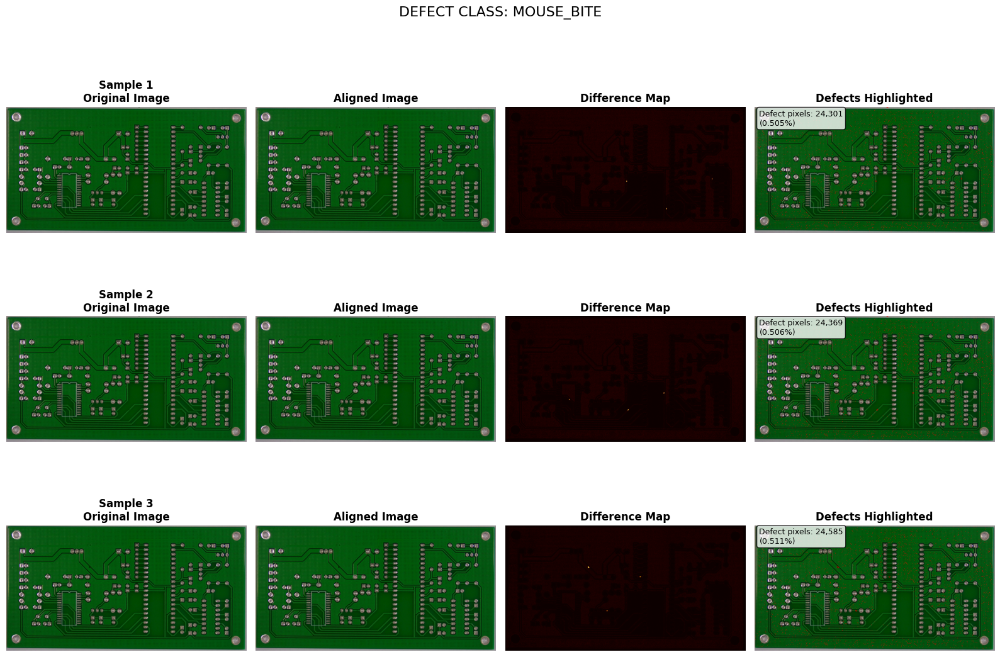

💾 Mouse_bite visualization saved: C:\Users\Kandu\info_temp\PCB_DATASET\modules/module1_image_processing\Mouse_bite_samples.png

🎯 DETAILED ANALYSIS: Open_circuit
--------------------------------------------------


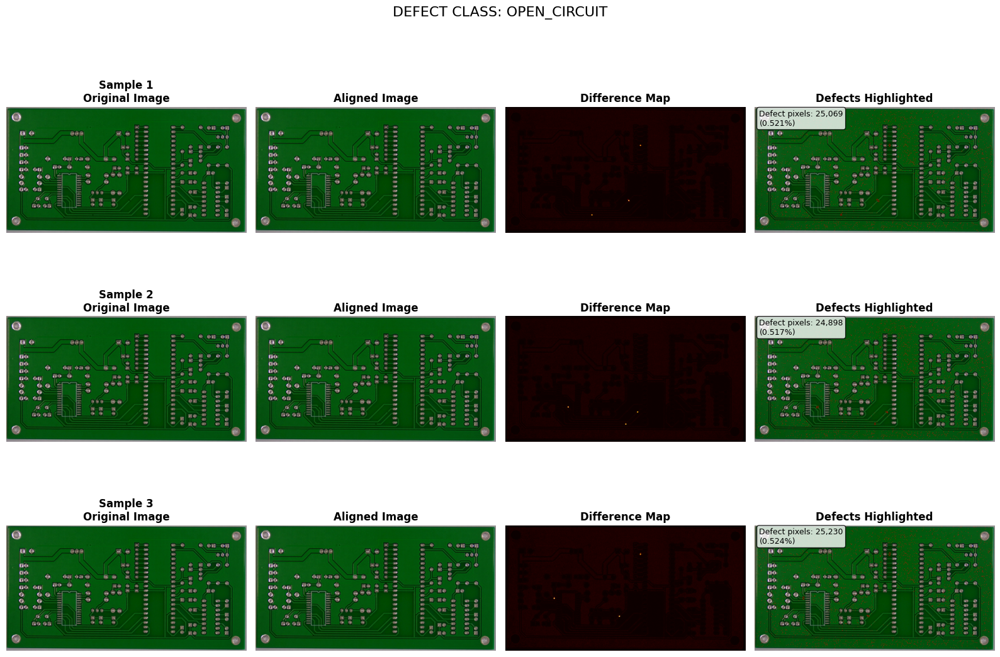

💾 Open_circuit visualization saved: C:\Users\Kandu\info_temp\PCB_DATASET\modules/module1_image_processing\Open_circuit_samples.png

🎯 DETAILED ANALYSIS: Short
--------------------------------------------------


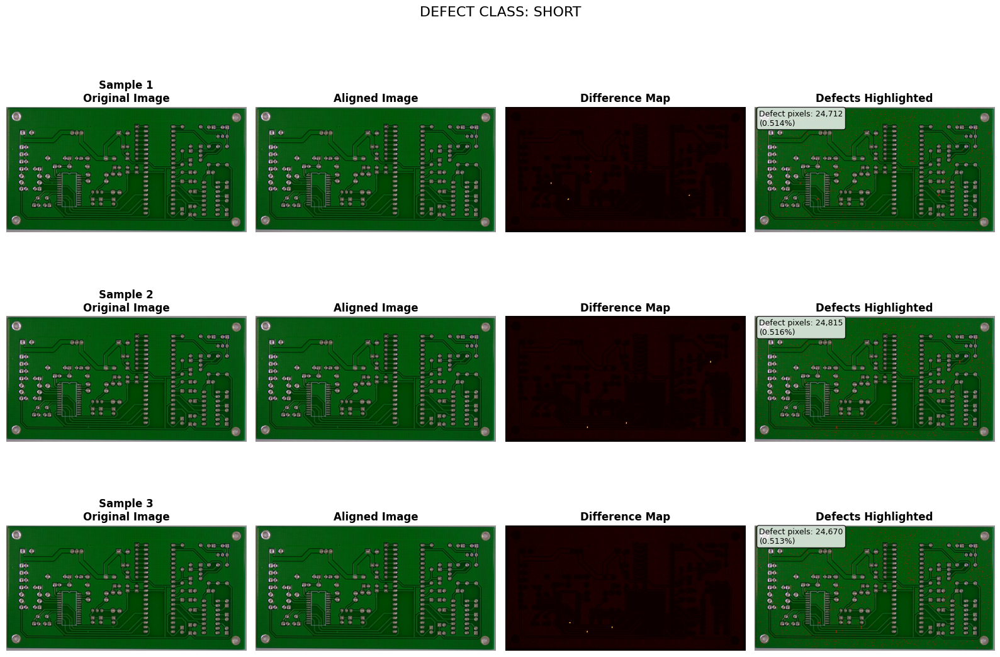

💾 Short visualization saved: C:\Users\Kandu\info_temp\PCB_DATASET\modules/module1_image_processing\Short_samples.png

🎯 DETAILED ANALYSIS: Spur
--------------------------------------------------


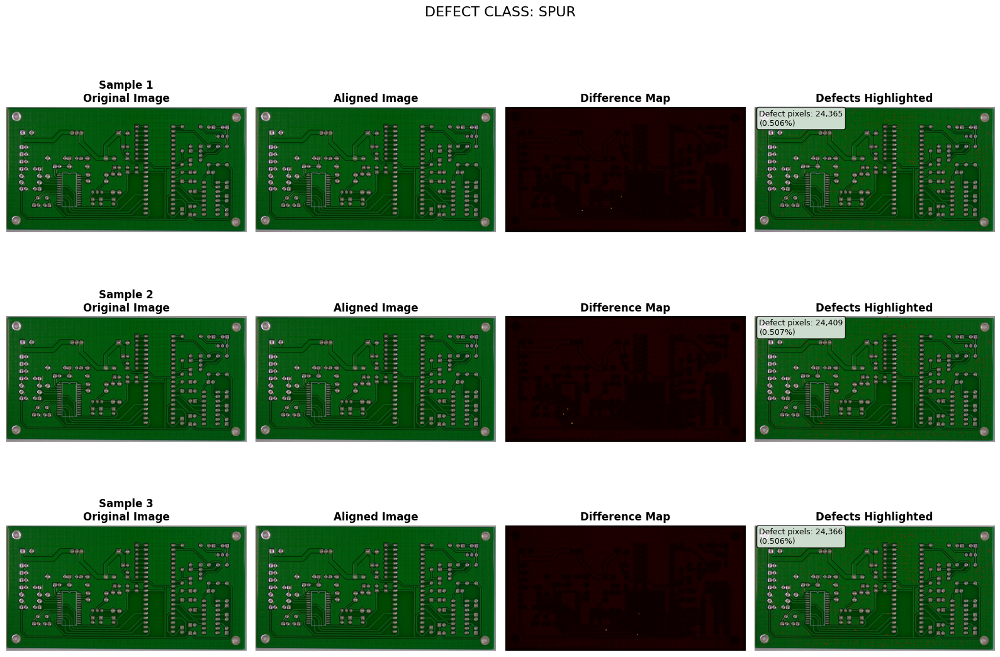

💾 Spur visualization saved: C:\Users\Kandu\info_temp\PCB_DATASET\modules/module1_image_processing\Spur_samples.png

🎯 DETAILED ANALYSIS: Spurious_copper
--------------------------------------------------


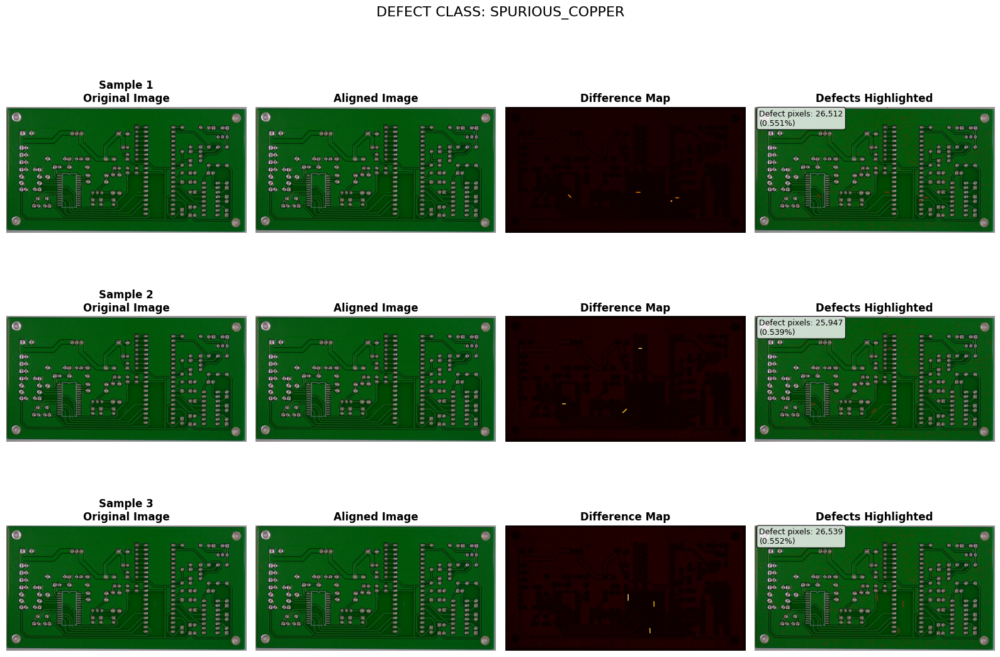

💾 Spurious_copper visualization saved: C:\Users\Kandu\info_temp\PCB_DATASET\modules/module1_image_processing\Spurious_copper_samples.png

3️⃣ GENERATING DEFECT STATISTICS

📊 DEFECT STATISTICS BY CLASS
Defect Pixel Statistics:
                defect_pixels                                   defect_ratio  \
                        count      mean       std   min     max         mean   
defect_class                                                                   
Missing_hole              115  19196.02  20832.56  1139   56841         0.00   
Mouse_bite                115  22896.32  22197.79  1418   87557         0.00   
Open_circuit              116  26798.08  23817.38  1301   88046         0.00   
Short                     116  36287.67  26298.71  1724   86598         0.01   
Spur                      115  25538.66  21988.24  2024  114186         0.00   
Spurious_copper           116  23384.45  24326.43  2809   90440         0.00   

                                 
                 st

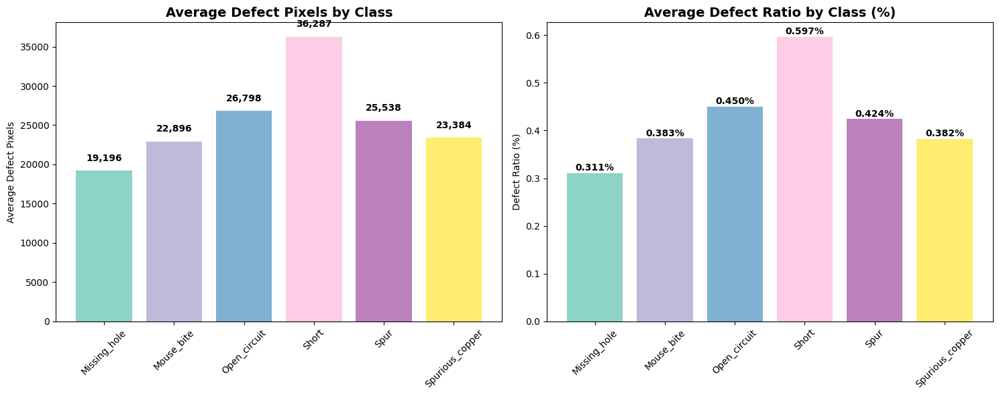

💾 Statistics visualization saved: C:\Users\Kandu\info_temp\PCB_DATASET\modules/module1_image_processing\defect_statistics.png

🎉 ALL VISUALIZATIONS COMPLETED!
📊 Generated visualizations include:
   ✅ Main comparison: All 6 defect classes side by side
   ✅ Individual analysis: Detailed views for each class
   ✅ Statistics: Defect size and ratio analysis
📍 All files saved in: C:\Users\Kandu\info_temp\PCB_DATASET/modules/module1_image_processing/


In [6]:
def display_samples_from_each_class():
    """Display one sample from each defect class with all processing steps"""

    # Defect classes
    defect_classes = ['Missing_hole', 'Mouse_bite', 'Open_circuit', 'Short', 'Spur', 'Spurious_copper']

    # Create a large figure for all samples
    fig, axes = plt.subplots(6, 5, figsize=(20, 24))
    fig.suptitle('PCB DEFECT DETECTION - SAMPLE FROM EACH DEFECT CLASS', fontsize=20, y=0.95)

    for row, defect_class in enumerate(defect_classes):
        print(f"🔍 Processing {defect_class}...")

        # Get all processed files for this class
        processed_dir = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/processed_images")
        mask_dir = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/defect_masks")
        diff_dir = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/difference_maps")
        viz_dir = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/visualizations")

        # Find files for this class
        class_files = [f for f in os.listdir(processed_dir) if f.startswith(f'aligned_{defect_class}_')]

        if not class_files:
            print(f"❌ No files found for {defect_class}")
            continue

        # Take first sample
        sample_file = class_files[0]
        base_name = sample_file.replace('aligned_', '').replace('.jpg', '')

        # Load all images
        try:
            # Reference PCB
            pcb_id = int(base_name.split('_')[1])  # Extract PCB ID from filename
            reference_path = os.path.join(PCB_DATASET_PATH, "PCB_USED", f"{pcb_id:02d}.JPG")
            reference = cv2.imread(reference_path)

            # Aligned defect image
            aligned_path = os.path.join(processed_dir, sample_file)
            aligned_defect = cv2.imread(aligned_path)

            # Defect mask
            mask_path = os.path.join(mask_dir, f"mask_{base_name}.png")
            defect_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            # Difference map
            diff_path = os.path.join(diff_dir, f"diff_{base_name}.png")
            diff_map = cv2.imread(diff_path, cv2.IMREAD_GRAYSCALE)

            # Visualization
            viz_path = os.path.join(viz_dir, f"viz_{base_name}.png")
            visualization = cv2.imread(viz_path)

            # Plot 1: Reference PCB
            axes[row, 0].imshow(cv2.cvtColor(reference, cv2.COLOR_BGR2RGB))
            axes[row, 0].set_title(f'{defect_class}\nReference PCB', fontweight='bold')
            axes[row, 0].axis('off')

            # Plot 2: Aligned Defect Image
            axes[row, 1].imshow(cv2.cvtColor(aligned_defect, cv2.COLOR_BGR2RGB))
            axes[row, 1].set_title('Aligned Test Image', fontweight='bold')
            axes[row, 1].axis('off')

            # Plot 3: Difference Map
            axes[row, 2].imshow(diff_map, cmap='hot')
            axes[row, 2].set_title('Difference Map', fontweight='bold')
            axes[row, 2].axis('off')

            # Plot 4: Defect Mask
            axes[row, 3].imshow(defect_mask, cmap='gray')
            axes[row, 3].set_title('Defect Mask', fontweight='bold')
            axes[row, 3].axis('off')

            # Plot 5: Defects Highlighted
            defect_highlighted = aligned_defect.copy()
            contours, _ = cv2.findContours(defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cv2.drawContours(defect_highlighted, contours, -1, (0, 0, 255), 3)

            axes[row, 4].imshow(cv2.cvtColor(defect_highlighted, cv2.COLOR_BGR2RGB))
            axes[row, 4].set_title('Defects Highlighted', fontweight='bold')
            axes[row, 4].axis('off')

            # Add defect statistics
            defect_pixels = np.count_nonzero(defect_mask)
            total_pixels = defect_mask.size
            defect_ratio = (defect_pixels / total_pixels) * 100

            # Add text with statistics
            stats_text = f"Defects: {defect_pixels:,} pixels\n({defect_ratio:.3f}% of image)"
            axes[row, 4].text(0.02, 0.98, stats_text, transform=axes[row, 4].transAxes,
                            fontsize=10, verticalalignment='top',
                            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

            print(f"✅ {defect_class}: {defect_pixels} defect pixels ({defect_ratio:.3f}%)")

        except Exception as e:
            print(f"❌ Error processing {defect_class}: {e}")
            # Create empty plots for failed cases
            for col in range(5):
                axes[row, col].text(0.5, 0.5, 'Error\nLoading\nImage',
                                  horizontalalignment='center', verticalalignment='center',
                                  transform=axes[row, col].transAxes, fontsize=12, color='red')
                axes[row, col].set_title(f'{defect_class}\nError', fontweight='bold')
                axes[row, col].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)

    # Save the comprehensive visualization
    output_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing", "all_defect_classes_comparison.png")
    plt.savefig(output_path, dpi=150, bbox_inches='tight')
    plt.show()

    print(f"\n💾 Comprehensive visualization saved: {output_path}")

    return output_path

def display_individual_class_details():
    """Display detailed individual visualizations for each class"""

    defect_classes = ['Missing_hole', 'Mouse_bite', 'Open_circuit', 'Short', 'Spur', 'Spurious_copper']

    for defect_class in defect_classes:
        print(f"\n🎯 DETAILED ANALYSIS: {defect_class}")
        print("-" * 50)

        # Get multiple samples for this class (2-3 samples)
        processed_dir = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/processed_images")
        class_files = [f for f in os.listdir(processed_dir) if f.startswith(f'aligned_{defect_class}_')]

        if not class_files:
            print(f"❌ No files found for {defect_class}")
            continue

        # Take up to 3 samples
        samples = class_files[:3]

        fig, axes = plt.subplots(len(samples), 4, figsize=(16, 4 * len(samples)))
        if len(samples) == 1:
            axes = axes.reshape(1, -1)

        fig.suptitle(f'DEFECT CLASS: {defect_class.upper()}', fontsize=16, y=0.95)

        for i, sample_file in enumerate(samples):
            base_name = sample_file.replace('aligned_', '').replace('.jpg', '')

            try:
                # Load images
                aligned_path = os.path.join(processed_dir, sample_file)
                aligned_defect = cv2.imread(aligned_path)

                mask_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/defect_masks", f"mask_{base_name}.png")
                defect_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

                diff_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/difference_maps", f"diff_{base_name}.png")
                diff_map = cv2.imread(diff_path, cv2.IMREAD_GRAYSCALE)

                # Original defect image
                original_filename = base_name.replace(f"{defect_class}_", "")
                original_path = os.path.join(PCB_DATASET_PATH, "images", defect_class, original_filename + ".jpg")
                original_defect = cv2.imread(original_path)

                # Plot 1: Original Defect Image
                axes[i, 0].imshow(cv2.cvtColor(original_defect, cv2.COLOR_BGR2RGB))
                axes[i, 0].set_title(f'Sample {i+1}\nOriginal Image', fontweight='bold')
                axes[i, 0].axis('off')

                # Plot 2: Aligned Image
                axes[i, 1].imshow(cv2.cvtColor(aligned_defect, cv2.COLOR_BGR2RGB))
                axes[i, 1].set_title('Aligned Image', fontweight='bold')
                axes[i, 1].axis('off')

                # Plot 3: Difference Map
                axes[i, 2].imshow(diff_map, cmap='hot')
                axes[i, 2].set_title('Difference Map', fontweight='bold')
                axes[i, 2].axis('off')

                # Plot 4: Defects Highlighted
                defect_highlighted = aligned_defect.copy()
                contours, _ = cv2.findContours(defect_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                cv2.drawContours(defect_highlighted, contours, -1, (0, 0, 255), 2)

                axes[i, 3].imshow(cv2.cvtColor(defect_highlighted, cv2.COLOR_BGR2RGB))
                axes[i, 3].set_title('Defects Highlighted', fontweight='bold')
                axes[i, 3].axis('off')

                # Add statistics
                defect_pixels = np.count_nonzero(defect_mask)
                defect_ratio = (defect_pixels / defect_mask.size) * 100

                stats_text = f"Defect pixels: {defect_pixels:,}\n({defect_ratio:.3f}%)"
                axes[i, 3].text(0.02, 0.98, stats_text, transform=axes[i, 3].transAxes,
                              fontsize=9, verticalalignment='top',
                              bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

            except Exception as e:
                print(f"❌ Error with sample {sample_file}: {e}")
                for col in range(4):
                    axes[i, col].text(0.5, 0.5, 'Error\nLoading',
                                    horizontalalignment='center', verticalalignment='center',
                                    transform=axes[i, col].transAxes, fontsize=10, color='red')
                    axes[i, col].axis('off')

        plt.tight_layout()
        plt.subplots_adjust(top=0.90)

        # Save individual class visualization
        class_output_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing", f"{defect_class}_samples.png")
        plt.savefig(class_output_path, dpi=150, bbox_inches='tight')
        plt.show()

        print(f"💾 {defect_class} visualization saved: {class_output_path}")

def show_defect_statistics():
    """Display statistics about defect sizes for each class"""

    print("\n📊 DEFECT STATISTICS BY CLASS")
    print("=" * 50)

    # Load processing results
    results_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing/reports", "processing_results.csv")

    if os.path.exists(results_path):
        import pandas as pd
        df = pd.read_csv(results_path)

        # Calculate statistics for each defect class
        stats = df.groupby('defect_class').agg({
            'defect_pixels': ['count', 'mean', 'std', 'min', 'max'],
            'defect_ratio': ['mean', 'std', 'min', 'max']
        }).round(2)

        print("Defect Pixel Statistics:")
        print(stats)

        # Create visualization
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

        # Plot 1: Average defect pixels by class
        avg_defects = df.groupby('defect_class')['defect_pixels'].mean()
        colors = plt.cm.Set3(np.linspace(0, 1, len(avg_defects)))

        bars = ax1.bar(avg_defects.index, avg_defects.values, color=colors)
        ax1.set_title('Average Defect Pixels by Class', fontweight='bold', fontsize=14)
        ax1.set_ylabel('Average Defect Pixels')
        ax1.tick_params(axis='x', rotation=45)

        # Add value labels on bars
        for bar in bars:
            height = bar.get_height()
            ax1.text(bar.get_x() + bar.get_width()/2., height + 1000,
                    f'{int(height):,}', ha='center', va='bottom', fontweight='bold')

        # Plot 2: Defect ratio distribution
        defect_ratios = df.groupby('defect_class')['defect_ratio'].mean() * 100  # Convert to percentage

        bars2 = ax2.bar(defect_ratios.index, defect_ratios.values, color=colors)
        ax2.set_title('Average Defect Ratio by Class (%)', fontweight='bold', fontsize=14)
        ax2.set_ylabel('Defect Ratio (%)')
        ax2.tick_params(axis='x', rotation=45)

        # Add value labels on bars
        for bar in bars2:
            height = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width()/2., height + 0.001,
                    f'{height:.3f}%', ha='center', va='bottom', fontweight='bold')

        plt.tight_layout()

        # Save statistics plot
        stats_path = os.path.join(PCB_DATASET_PATH, "modules/module1_image_processing", "defect_statistics.png")
        plt.savefig(stats_path, dpi=150, bbox_inches='tight')
        plt.show()

        print(f"💾 Statistics visualization saved: {stats_path}")

    else:
        print("❌ Processing results file not found")

# Execute the visualization functions
print("🚀 GENERATING COMPREHENSIVE VISUALIZATIONS")
print("=" * 50)

# 1. Main comparison across all classes
print("\n1️⃣ GENERATING MAIN COMPARISON ACROSS ALL CLASSES")
main_viz_path = display_samples_from_each_class()

# 2. Detailed individual class analysis
print("\n2️⃣ GENERATING DETAILED INDIVIDUAL CLASS ANALYSIS")
display_individual_class_details()

# 3. Defect statistics
print("\n3️⃣ GENERATING DEFECT STATISTICS")
show_defect_statistics()

print(f"\n🎉 ALL VISUALIZATIONS COMPLETED!")
print("=" * 40)
print("📊 Generated visualizations include:")
print("   ✅ Main comparison: All 6 defect classes side by side")
print("   ✅ Individual analysis: Detailed views for each class")
print("   ✅ Statistics: Defect size and ratio analysis")
print(f"📍 All files saved in: {PCB_DATASET_PATH}/modules/module1_image_processing/")

In [8]:
import os

dataset_path = "processed_images"

if not os.path.exists(dataset_path):
    print(f"Folder '{dataset_path}' does not exist. Check path!")
else:
    subfolders = [f for f in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, f))]
    print(f"Subfolders in '{dataset_path}': {subfolders}")

    # Optionally, list first 5 files in each subfolder
    for sub in subfolders:
        files = os.listdir(os.path.join(dataset_path, sub))
        print(f"{sub} contains {len(files)} files: {files[:5]} ...")


Folder 'processed_images' does not exist. Check path!


In [9]:
import os
print("Current working directory:", os.getcwd())


Current working directory: C:\Users\Kandu\info_temp\PCB_DATASET
